<a href="https://colab.research.google.com/github/NourRabee/Communication_Project/blob/main/ProjectCommunication.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Import required libraries

In [ ]:
import wave 
from scipy.io import wavfile
import numpy as np 
import matplotlib.pyplot as plt 
from scipy.signal import butter, lfilter, freqz
import os
import scipy.io
import scipy.io.wavfile

Upsampler function

In [ ]:
def upsampler(input_signal, upsamplerate):
   L=input_signal.shape[0]
   return np.reshape(np.transpose(np.ones([upsamplerate,1])*input_signal),[upsamplerate*L])

Downsampler function

In [ ]:
def downsampler(input_signal, downsamplerate):
   L=input_signal.shape[0]
   return input_signal[0::downsamplerate]

Plot signal in the time and frequency domain function

In [ ]:
def plotTimeFreq(y, Fs, BWrange):
  n = len(y) # length of the signal
  k = np.arange(n)
  T = n/Fs
  
  t = np.arange(0,n*Ts,Ts) # time vector

  frq = k/T # two sides frequency range
  fcen=frq[int(len(frq)/2)]
  frq_DS=frq-fcen
  frq_SS = frq[range(int(n/2))] # one side frequency range

  Y = np.fft.fft(y) # fft computing and normalization
  yinv= np.fft.ifft(Y).real # ifft computing and normalization
  Y_DS=np.roll(Y,int(n/2))
  Y_SS = Y[range(int(n/2))]

  fcenIndex = (np.abs(frq_DS)).argmin()
  RangeIndex = (np.abs(frq_DS-BWrange)).argmin() - fcenIndex

  RangeIndexMin = fcenIndex-RangeIndex
  if RangeIndexMin < 0:
    RangeIndexMin = 0

  RangeIndexMax = fcenIndex+RangeIndex
  if RangeIndexMax > len(frq_DS)-1:
    RangeIndexMax = len(frq_DS)-1

  fig, ax = plt.subplots(2, 1,  figsize=(16, 6))
  ax[0].plot(t,y)
  ax[0].set_xlabel('Time')
  ax[0].set_ylabel('Amplitude')
  ax[1].set_xlabel('Freq (Hz)')
  ax[1].set_ylabel('|Y(freq)|')
  ax[1].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Y_DS[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum
  ax[1].set_xlabel('Freq (Hz)')
  ax[1].set_ylabel('|Y(freq)|')

  return yinv

Demodultion body

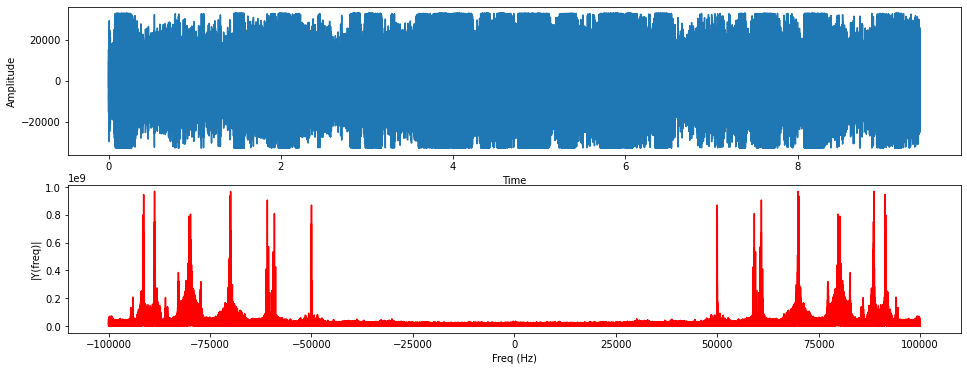

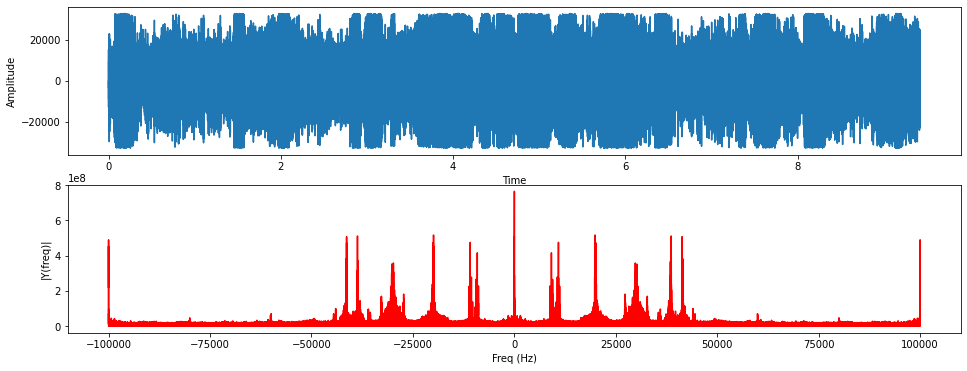

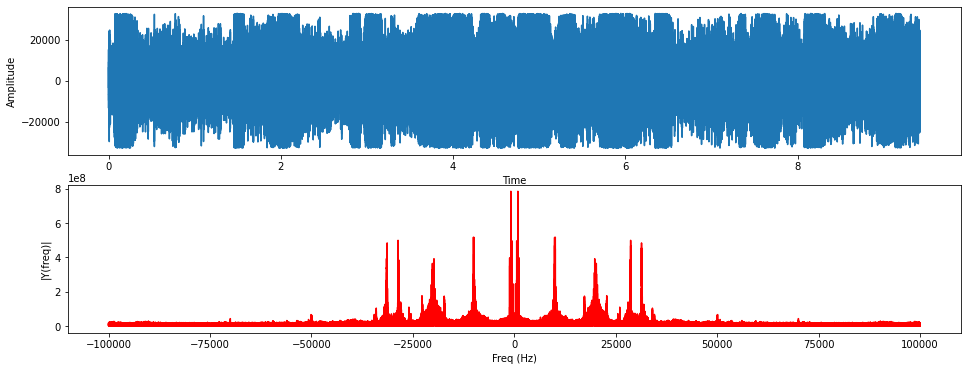

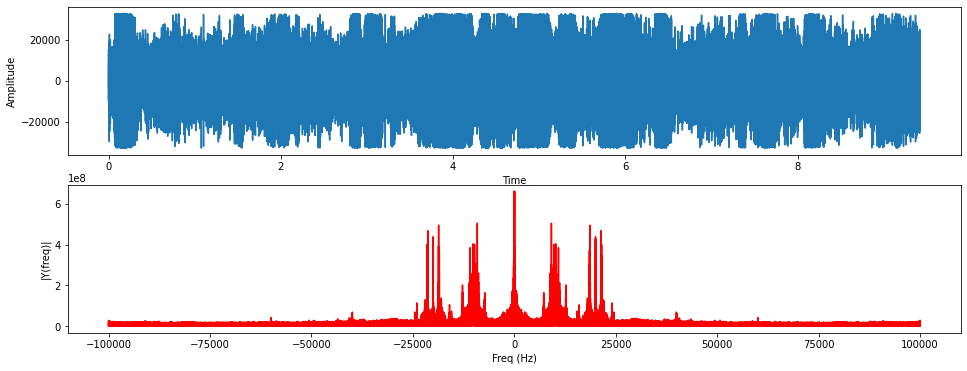

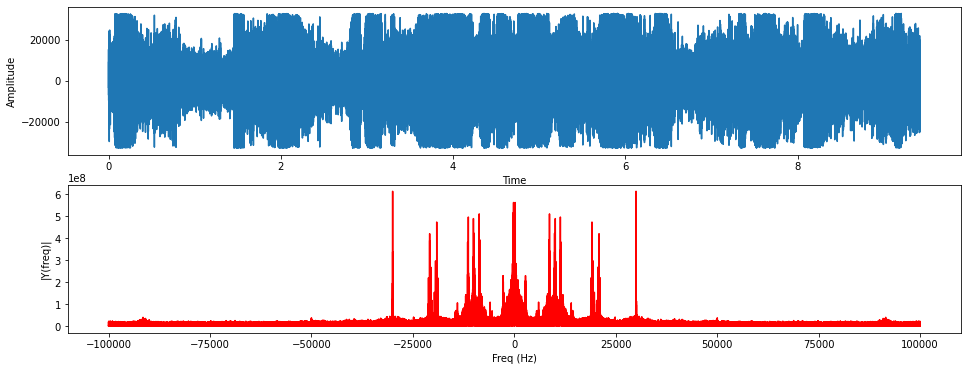

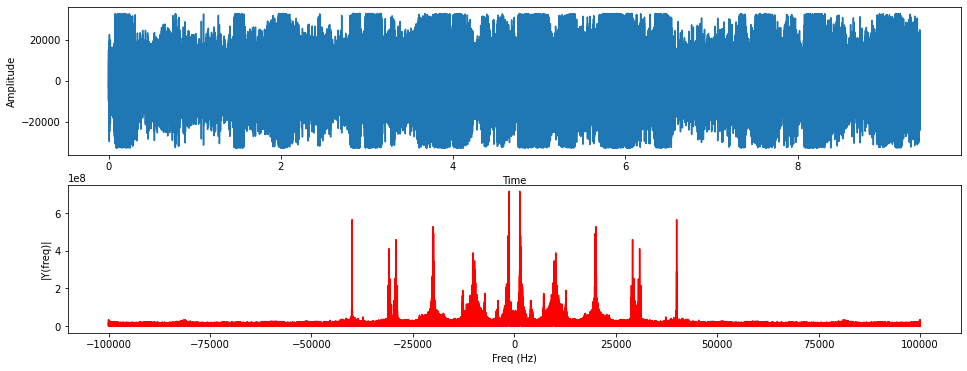

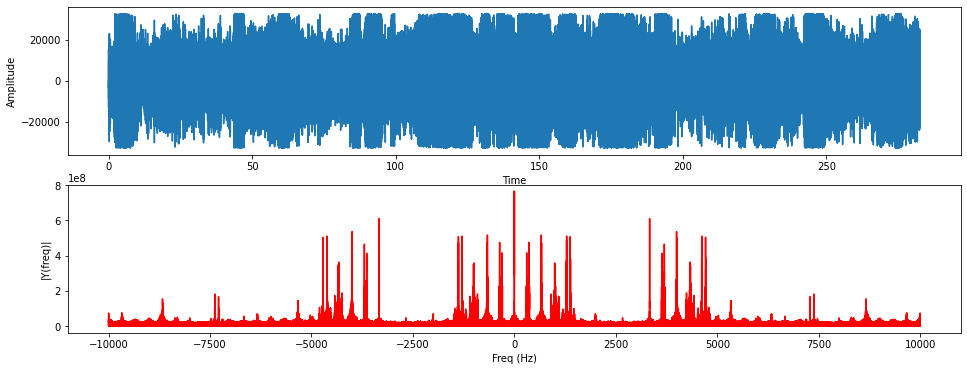

Enter BW :100


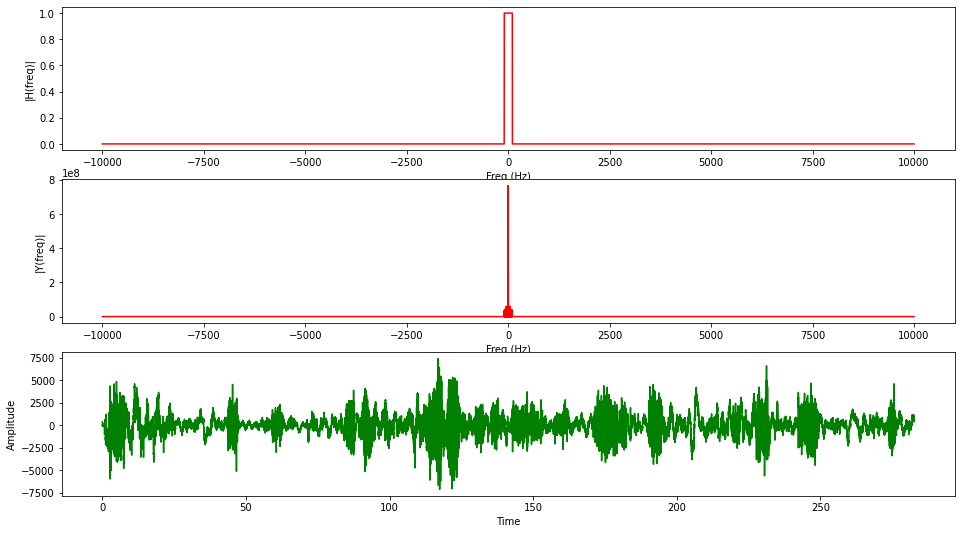

In [ ]:
sound1='./sound1.wav'
sound2='./sound2.wav'
sound3='./sound3.wav'
sound4='./sound4.wav'
sound5='./sound5.wav'
filewave = '/content/FDMAMixedAudio2.wav'
fcmax=90000
BW=3000
BWrange=100000

########-------------------
upsamplerate = int(fcmax/BW)
downsamplerate = int(fcmax/BW)

rate, data = wavfile.read(filewave)

Fs=rate*upsamplerate
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,len(data)*Ts,Ts) # time vector

yinv = plotTimeFreq(data, Fs, BWrange)

carrier_signal = np.cos(2*np.pi*50000*t)
output_signal = data*carrier_signal
yinv = plotTimeFreq(output_signal, Fs, BWrange)

wavfile.write(sound1, rate, output_signal)

carrier_signal = np.cos(2*np.pi*60000*t)
output_signal = data*carrier_signal
yinv = plotTimeFreq(output_signal, Fs, BWrange)
wavfile.write(sound2, rate, output_signal)

carrier_signal = np.cos(2*np.pi*70000*t)
output_signal = data*carrier_signal
yinv = plotTimeFreq(output_signal, Fs, BWrange)
wavfile.write(sound3, rate, output_signal)

carrier_signal = np.cos(2*np.pi*80000*t)
output_signal = data*carrier_signal
yinv = plotTimeFreq(output_signal, Fs, BWrange)
wavfile.write(sound4, rate, output_signal)

carrier_signal = np.cos(2*np.pi*90000*t)
output_signal = data*carrier_signal
yinv = plotTimeFreq(output_signal, Fs, BWrange)
wavfile.write(sound5, rate, output_signal)

######################################################

################################################
filenameWave='/content/sound1.wav'
filenameWavefiltered='./Filtered.wav'
filenameWavewithoutfilter='./Withoutfilter.wav'
BWrange=10000
################################################

write=1
read=1
rate, data = wavfile.read(filenameWave)
if len(data.shape) > 1:
   data=data[:,0]

filtereddata = np.fft.rfft(data, axis=0)

filteredwrite = np.fft.irfft(filtereddata, axis=0)
##############################################
## Generate Signal and add save it to text file
Fs=rate


Ts = 1.0/Fs; # sampling interval
t = np.arange(0,len(data)*Ts,Ts) # time vector

y=[float(x) for x in data]
## Write values to a file
#Open new data file
if write!=0:
   f = open("Signal_in_text.txt", "w")
   for i in range(len(y)):
       f.write( str(y[i]) + " " + str(float(t[i])) + "\n"  )
   f.close()

## Read values from a file
if read !=0:
   with open('Signal_in_text.txt') as f:
      w=f.read()
   y=[];
   t=[];
   for x in w.split('\n'):
      if x != '':
         y.append(float(x.split()[0]))
         t.append(float(x.split()[1]))


n = len(y) # length of the signal
k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
fcen=frq[int(len(frq)/2)]
frq_DS=frq-fcen
frq_SS = frq[range(int(n/2))] # one side frequency range

Y = np.fft.fft(y) # fft computing and normalization
yinv= np.fft.ifft(Y).real # ifft computing and normalization
yinv = downsampler(yinv, downsamplerate)
Y_DS=np.roll(Y,int(n/2))
Y_SS = Y[range(int(n/2))]

fcenIndex = (np.abs(frq_DS)).argmin()
RangeIndex = (np.abs(frq_DS-BWrange)).argmin() - fcenIndex

RangeIndexMin = fcenIndex-RangeIndex
if RangeIndexMin < 0:
  RangeIndexMin = 0

RangeIndexMax = fcenIndex+RangeIndex
if RangeIndexMax > len(frq_DS)-1:
  RangeIndexMax = len(frq_DS)-1

fig, ax = plt.subplots(2, 1,  figsize=(16, 6))
ax[0].plot(t,y)
ax[0].set_xlabel('Time')
ax[0].set_ylabel('Amplitude')
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')
ax[1].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Y_DS[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')

plt.show()

y=np.array(y)
y_int=y.astype(np.int16)
yinv=np.array(yinv)

# yinv = downsampler(yinv, downsamplerate)

yinv_int=yinv.astype(np.int16)
wavfile.write(filenameWavewithoutfilter, rate, y_int)

B = int(input ("Enter BW :"))

fBWIndex = (np.abs(frq_DS - B)).argmin()
B = frq_DS[fBWIndex]

Mask_DS=np.ones(len(frq_DS))
Yf_DS=np.copy(Y_DS)
Bmax=frq_DS[len(frq_DS)-1]
Bmin=0
Bold=0

Yf_DS=np.copy(Y_DS)
for cnt in range(len(frq_DS)):
  if ~(((frq_DS[cnt])>-1*B) and ((frq_DS[cnt])<B)):
    Mask_DS[cnt]=0;
    #print(B,frq_DS[cnt],Yf_DS[cnt])
    Yf_DS[cnt]=Y_DS[cnt]*0;

Yf=np.roll(Yf_DS,int(n/2))
yinv= np.fft.ifft(Yf).real # ifft computing and normalization
yinv=np.array(yinv)

yinv_int=yinv.astype(np.int16)
wavfile.write(filenameWavefiltered, rate, yinv_int)

fig, ax = plt.subplots(3, 1,  figsize=(16, 9))
ax[0].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Mask_DS[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum
ax[0].set_xlabel('Freq (Hz)')
ax[0].set_ylabel('|H(freq)|')
ax[1].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Yf_DS[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')
ax[2].plot(t,yinv,'g') # plotting the spectrum
ax[2].set_xlabel('Time')
ax[2].set_ylabel('Amplitude')

plt.show()

yinv = downsampler(yinv, downsamplerate)

In [ ]:
from IPython.display import Audio
# Generate a player for mono sound
Audio(yinv,rate=rate)

In [ ]:
from IPython.display import Audio
# Generate a player for mono sound
Audio(yinv,rate=rate)

# New Section